# Realistic Loan Approval Dataset | US & Canada


In [1]:
#import needed python libraries
import numpy as np, pandas as pd, plotly.express as px, matplotlib.pyplot as plt, seaborn as sns

In [2]:
Loan_df = pd.read_csv("Loan_approval_data_2025.csv")

In [3]:
Loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   customer_id              50000 non-null  object 
 1   age                      50000 non-null  int64  
 2   occupation_status        50000 non-null  object 
 3   years_employed           50000 non-null  float64
 4   annual_income            50000 non-null  int64  
 5   credit_score             50000 non-null  int64  
 6   credit_history_years     50000 non-null  float64
 7   savings_assets           50000 non-null  int64  
 8   current_debt             50000 non-null  int64  
 9   defaults_on_file         50000 non-null  int64  
 10  delinquencies_last_2yrs  50000 non-null  int64  
 11  derogatory_marks         50000 non-null  int64  
 12  product_type             50000 non-null  object 
 13  loan_intent              50000 non-null  object 
 14  loan_amount           

In [55]:
pivot_data = Loan_df.loc[Loan_df['loan_status'] == 1, 
                         ['loan_intent', 
                          'product_type', 
                          'occupation_status', 
                          'loan_status', 
                          'loan_amount', 
                          'interest_rate']]

In [56]:
pivot_data

,loan_intent,product_type,occupation_status,loan_status,loan_amount,interest_rate
0,Business,Credit Card,Employed,1,600,17.02
2,Debt Consolidation,Credit Card,Student,1,2100,18.33
3,Business,Credit Card,Student,1,2900,18.74
4,Education,Personal Loan,Employed,1,99600,13.92
6,Home Improvement,Personal Loan,Employed,1,45600,11.02
...,...,...,...,...,...,...
49986,Medical,Credit Card,Employed,1,70000,17.04
49988,Business,Credit Card,Student,1,6800,14.86
49989,Education,Credit Card,Employed,1,35900,17.31
49993,Personal,Credit Card,Employed,1,2400,18.06


In [58]:
df_pivot = pd.pivot_table(data=pivot_data, 
                          index=['loan_intent', 'product_type'],
                          columns=['occupation_status'],
                          values=['interest_rate'],
                          aggfunc={'interest_rate': 'mean'})

df_pivot = df_pivot.round(2)

#loan_cols = [col for col in df_pivot.columns if 'loan_amount' in col]
#df_pivot[loan_cols] = df_pivot[loan_cols].applymap(lambda x: f"{x:,.2f}" if pd.notnull(x) else "")

In [59]:
df_pivot

interest_rate                      
occupation_status                      Employed Self-Employed Student
loan_intent        product_type                                      
Business           Credit Card            17.96         17.77   18.47
                   Line of Credit          9.69          9.74    9.96
                   Personal Loan          11.69         11.36   11.52
Debt Consolidation Credit Card            17.73         17.76   18.32
                   Line of Credit          9.61          9.61    9.19
                   Personal Loan          11.17         11.27   11.05
Education          Credit Card            18.64         18.59   19.09
                   Line of Credit         10.49         10.38   10.71
                   Personal Loan          12.38         12.43   12.27
Home Improvement   Credit Card            18.20         18.07   18.89
                   Line of Credit          9.87         10.16    9.73
                   Personal Loan          11.85         11.82   11.55
Medical            Credit Card            18.27         18.09   18.98
                   Line of Credit          9.89         10.11    9.94
                   Personal Loan          11.83         11.88   11.69
Personal           Credit Card            18.43         18.42   18.99
                   Line of Credit         10.30         10.40   10.51
                   Personal Loan          12.11         12.06   12.03

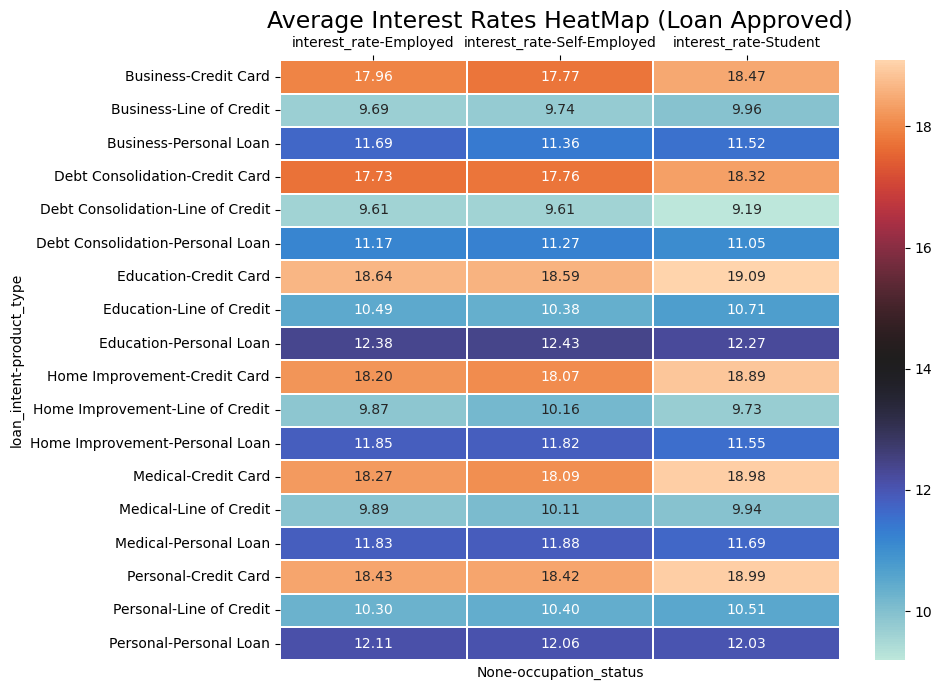

In [54]:
fig1, ax = plt.subplots(figsize=(10,7))

sns.heatmap(data=df_pivot, 
            annot=True, 
            linewidths=.2, 
            cmap='icefire', 
            fmt=".2f", 
            ax=ax)

ax.xaxis.tick_top()  # Move x-axis labels to the top
plt.title("Average Interest Rates HeatMap (Loan Approved)", fontsize= 17)
fig1.tight_layout()
plt.show()

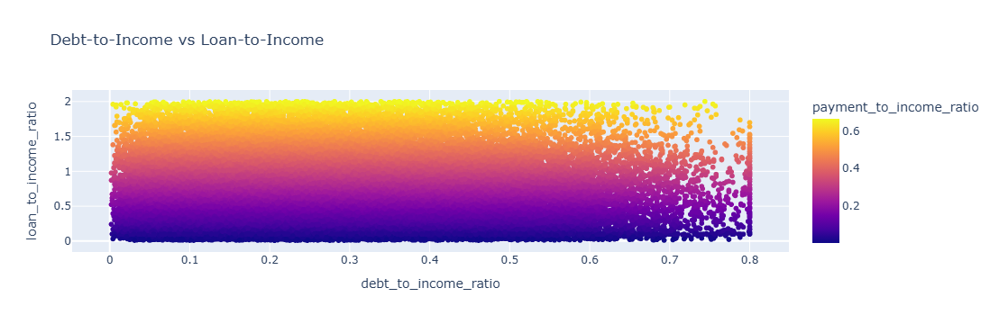

In [89]:
fig2 = px.scatter(Loan_df, x='debt_to_income_ratio', 
                  y='loan_to_income_ratio', 
                  color='payment_to_income_ratio', 
                  title="Debt-to-Income vs Loan-to-Income")
fig2.show()

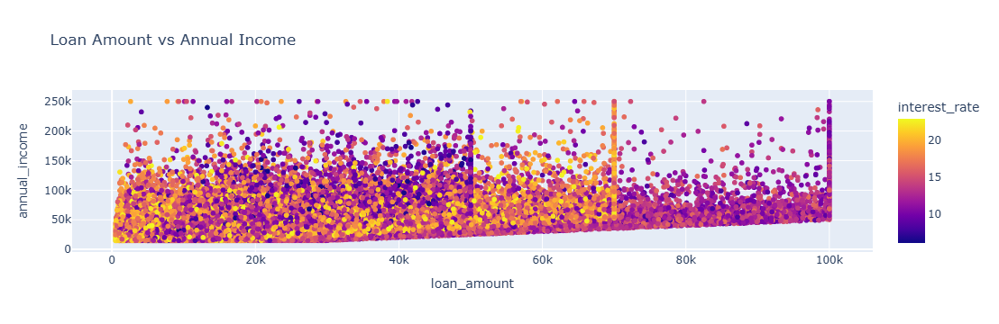

In [88]:
fig3 = px.scatter(Loan_df, x='loan_amount', 
                  y='annual_income', 
                  color='interest_rate', 
                  title="Loan Amount vs Annual Income")
fig3.show()

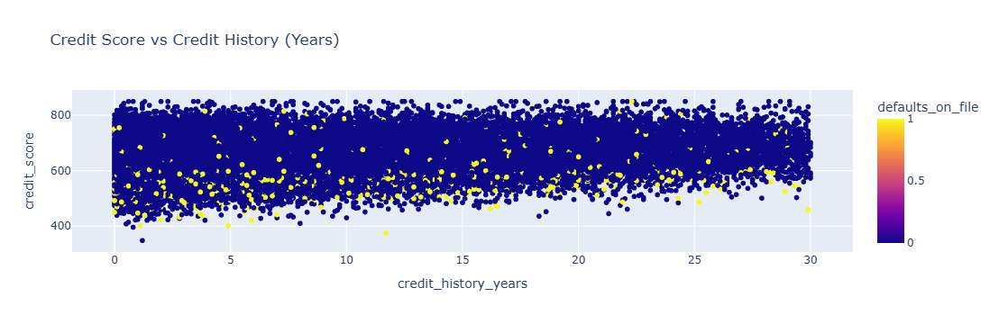

In [87]:
fig4 = px.scatter(Loan_df, x='credit_history_years', 
                  y='credit_score', 
                  color='defaults_on_file', 
                  title="Credit Score vs Credit History (Years)")
fig4.show()

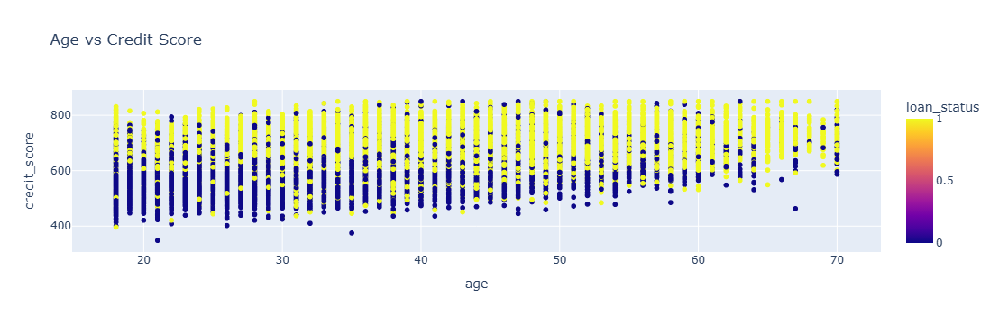

In [86]:
fig4 = px.scatter(Loan_df, x='age', 
                  y='credit_score', 
                  color='loan_status', 
                  title="Age vs Credit Score")
fig4.show()

In [90]:
fig4 = px.sunburst(Loan_df, path =['age', 'credit_score'] 
                  color='loan_status', 
                  title="Age vs Credit Score")
fig4.show()

TypeError: sunburst() got an unexpected keyword argument 'x'